Scotland housing price

In [224]:
#Pandas for dataframe analysis
import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# tranform JSON file into a pandas dataframe
from pandas.io.json import json_normalize 

#Numpy for array operations
import numpy as np 

#json for handling with json data
import json 

# convert address into coordinate values
from geopy.geocoders import Nominatim
import geocoder

# library to handle requests
import requests 

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# KMeans from sklearn for clustering
from sklearn.cluster import KMeans

# to render map
import folium 

#beautiful soup library for importing html format
#!pip install beautifulsoup4    #to install bs4 package
from bs4 import BeautifulSoup

#package to process html and xml
import lxml

print('Libraries imported.')

Libraries imported.


In [60]:
# !wget -O scotland_house_price.xlsx https://www.ros.gov.uk/__data/assets/excel_doc/0010/173575/RoS_monthly-house-price-statistics_tables_Oct-2020.xlsx

In [225]:
# !wget -O scotland.json https://github.com/martinjc/UK-GeoJSON/raw/master/json/administrative/sco/lad.json

In [63]:
# !wget -O scotland_area.xlsx https://www.ros.gov.uk/__data/assets/excel_doc/0016/162016/property-market-report-2019-2020.xlsx

In [ ]:
# !wget -O population.xls https://www.ons.gov.uk/file?uri=%2fpeoplepopulationandcommunity%2fpopulationandmigration%2fpopulationestimates%2fdatasets%2fpopulationestimatesforukenglandandwalesscotlandandnorthernireland%2fmid2019april2020localauthoritydistrictcodes/ukmidyearestimates20192020ladcodes.xls

In [454]:


g = geocoder.google('Mountain View, CA')
g.latlng

In [163]:
scotland_area = pd.read_excel("scotland_area.xlsx", sheet_name = "Table 48", header = 7, usecols = "A:E", nrows = 33, index_col = 0)
scotland_area.dropna(axis = 0, inplace=True)
scotland_area.columns = ["LocalAuthority", "UrbanAreas", "RuralAreas", "TotalArea"]
scotland_area = scotland_area[["UrbanAreas", "RuralAreas", "TotalArea"]]

In [164]:
scotland_area.head()

,UrbanAreas,RuralAreas,TotalArea
Local authority code,,,
S12000033,8478.177586,10092.451054,18570.628640
S12000034,5770.833679,625490.050889,631260.884568
S12000041,3000.761652,215177.785564,218178.547216
S12000035,2312.039540,688634.581138,690946.620678
S12000036,13343.762443,12989.628748,26333.391191


In [165]:
address = 'Midlothian, Scotland '

geolocator = Nominatim(user_agent="toronto_explorer")
location = geolocator.geocode(address)

#declare latitude ang longitude of Toronto
latitude = location.latitude
longitude = location.longitude

print('The geograpical coordinate of City of Edinburgh are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of City of Edinburgh are 55.833333, -3.083333.


In [166]:
df = pd.read_excel("scotland_house_price.xlsx", sheet_name = "Summary", header = 7, usecols = "C:G", nrows = 33, index_col = 0)
df.dropna(axis = 0, inplace=True)
df.columns = ["LocalAuthority", "AveragePrice", "SalesVolume", "TotalValue"]
df['latitude'] = ""
df['longitude'] = ""

In [167]:
for i, place in enumerate(df['LocalAuthority']):
    address = str(place + ", Scotland, United Kingdom")
    geolocator = Nominatim(user_agent="tartan_explorer")
    location = geolocator.geocode(address)
    df.iloc[i,4] = location.latitude
    df.iloc[i,5] = location.longitude

In [168]:
df.head()

,LocalAuthority,AveragePrice,SalesVolume,TotalValue,latitude,longitude
Local authority code,,,,,,
S12000033,Aberdeen City,185268.611241,427.0,79109697.0,57.1482,-2.09281
S12000034,Aberdeenshire,216034.723282,524.0,113202195.0,57.1667,-2.66667
S12000041,Angus,181711.374501,251.0,45609555.0,56.6667,-2.91667
S12000035,Argyll and Bute,180471.890688,247.0,44576557.0,56.4603,-5.86184
S12000036,City of Edinburgh,296394.368824,1174.0,347966989.0,55.9533,-3.18837


In [169]:
scotland_df = df.merge(scotland_area, how="outer", left_index=True, right_index=True)

In [170]:
scotland_df.head()

,LocalAuthority,AveragePrice,SalesVolume,TotalValue,latitude,longitude,UrbanAreas,RuralAreas,TotalArea
Local authority code,,,,,,,,,
S12000033,Aberdeen City,185268.611241,427.0,79109697.0,57.1482,-2.09281,8478.177586,10092.451054,18570.628640
S12000034,Aberdeenshire,216034.723282,524.0,113202195.0,57.1667,-2.66667,5770.833679,625490.050889,631260.884568
S12000041,Angus,181711.374501,251.0,45609555.0,56.6667,-2.91667,3000.761652,215177.785564,218178.547216
S12000035,Argyll and Bute,180471.890688,247.0,44576557.0,56.4603,-5.86184,2312.039540,688634.581138,690946.620678
S12000036,City of Edinburgh,296394.368824,1174.0,347966989.0,55.9533,-3.18837,13343.762443,12989.628748,26333.391191


In [171]:
address = 'Perth and Kinross, Scotland '

geolocator = Nominatim(user_agent="toronto_explorer")
location = geolocator.geocode(address)

#declare latitude ang longitude of Toronto
latitude = location.latitude
longitude = location.longitude

print('The geograpical coordinate of City of Edinburgh are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of City of Edinburgh are 56.5, -3.75.


In [174]:
population = pd.read_excel("population.xls", sheet_name = "MYE2 - Persons", header = 4, usecols= "A,D", nrows = 426, index_col = 0)
population.dropna(axis = 0, inplace=True)
population.columns = ['Population']

In [175]:
# population = population[['FeatureCode', 'Value']]

In [176]:
population.tail()

,Population
Code,
N09000006,117397
N09000007,146002
N09000008,139274
N09000009,148528
N09000010,181368


In [177]:
scotland_df_all = scotland_df.merge(population, how="left", left_index=True, right_index=True)

In [191]:
scotland_df_all.reset_index(inplace=True)

In [226]:
scotland_df_all.head()

,Local authority code,LocalAuthority,AveragePrice,SalesVolume,TotalValue,latitude,longitude,UrbanAreas,RuralAreas,TotalArea,Population,PopDensity
0,S12000033,Aberdeen City,185268.611241,427.0,79109697.0,57.1482,-2.09281,8478.177586,10092.451054,18570.628640,228670,12.313530
1,S12000034,Aberdeenshire,216034.723282,524.0,113202195.0,57.1667,-2.66667,5770.833679,625490.050889,631260.884568,261210,0.413791
2,S12000041,Angus,181711.374501,251.0,45609555.0,56.6667,-2.91667,3000.761652,215177.785564,218178.547216,116200,0.532591
3,S12000035,Argyll and Bute,180471.890688,247.0,44576557.0,56.4603,-5.86184,2312.039540,688634.581138,690946.620678,85870,0.124279
4,S12000036,City of Edinburgh,296394.368824,1174.0,347966989.0,55.9533,-3.18837,13343.762443,12989.628748,26333.391191,524930,19.934007


In [207]:
scotland_df_all['PopDensity'] = scotland_df_all["Population"] / scotland_df_all['TotalArea']

In [404]:
scotland_df_all

,Local authority code,LocalAuthority,AveragePrice,SalesVolume,TotalValue,latitude,longitude,UrbanAreas,RuralAreas,TotalArea,Population,PopDensity
0,S12000033,Aberdeen City,185268.611241,427.0,7.910970e+07,57.1482,-2.09281,8478.177586,1.009245e+04,1.857063e+04,228670,12.313530
1,S12000034,Aberdeenshire,216034.723282,524.0,1.132022e+08,57.1667,-2.66667,5770.833679,6.254901e+05,6.312609e+05,261210,0.413791
2,S12000041,Angus,181711.374501,251.0,4.560956e+07,56.6667,-2.91667,3000.761652,2.151778e+05,2.181785e+05,116200,0.532591
3,S12000035,Argyll and Bute,180471.890688,247.0,4.457656e+07,56.4603,-5.86184,2312.039540,6.886346e+05,6.909466e+05,85870,0.124279
4,S12000036,City of Edinburgh,296394.368824,1174.0,3.479670e+08,55.9533,-3.18837,13343.762443,1.298963e+04,2.633339e+04,524930,19.934007
5,S12000005,Clackmannanshire,192275.352900,100.0,1.922754e+07,56.1664,-3.7514,5475.491721,1.038827e+04,1.586376e+04,51540,3.248914
6,S12000006,Dumfries and Galloway,162492.149152,295.0,4.793518e+07,55.0833,-3.83333,3766.424280,6.388531e+05,6.426195e+05,148860,0.231646
7,S12000042,Dundee City,155088.108695,322.0,4.993837e+07,56.4738,-2.96642,4940.165531,1.037518e+03,5.977683e+03,149320,24.979578
8,S12000008,East Ayrshire,134281.111607,224.0,3.007897e+07,55.5,-4.25,3646.124929,1.225661e+05,1.262122e+05,122010,0.966705
9,S12000045,East Dunbartonshire,240413.209821,224.0,5.385256e+07,55.9333,-4.2,3194.005602,1.425488e+04,1.744888e+04,108640,6.226186


In [405]:
scotlandgeo = 'scotland.json'
scotland_map = folium.Map(location=[latitude, longitude], zoom_start=6)
scotland_map.choropleth(
    geo_data=scotlandgeo,
    data=scotland_df_all,
    columns=['Local authority code','Population'],
    key_on='feature.properties.LAD13CD',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Population Density of Scotland'
)

# add markers to map
for lat, lng, LA in zip(scotland_df['latitude'], scotland_df['longitude'], scotland_df['LocalAuthority']):
    label = '{}'.format(LA)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=4,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.4,
        parse_html=False).add_to(scotland_map)  
    
scotland_map

C:\ProgramData\Anaconda3\lib\site-packages\folium\folium.py:411: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


In [219]:
import seaborn as sns
import matplotlib.pyplot as plt

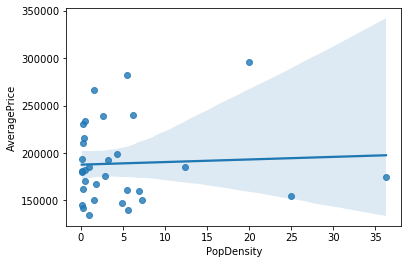

In [362]:
sns.regplot(data=scotland_df_all, x="PopDensity", y="AveragePrice")
plt.show()

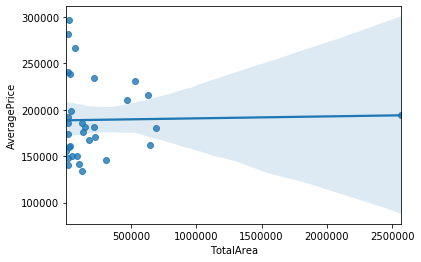

In [363]:
sns.regplot(data=scotland_df_all, x="TotalArea", y="AveragePrice")
plt.show()

In [417]:
def getNearbyVenues(names, latitudes, longitudes, radius=2500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            1000)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['LocalAuthority', 
                  'LocalAuth Latitude', 
                  'LocalAuth Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [300]:
CLIENT_ID = 'J3CMVHKAWSEY0XERG4LZAXGQXF3JS3YZHUICIJNX3K3UYOD0' # your Foursquare ID
CLIENT_SECRET = 'I2K5FYQT1NJTHBZP4XKWUY4OYTXMS02S4ODUUJVTBQ3KBRNA' # your Foursquare Secret
ACCESS_TOKEN = '4ALZXGOA4IKH5AZXI44FDFITI3JKEWLADWE34HCI3LL4KGI3' # your FourSquare Access Token
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: J3CMVHKAWSEY0XERG4LZAXGQXF3JS3YZHUICIJNX3K3UYOD0
CLIENT_SECRET:I2K5FYQT1NJTHBZP4XKWUY4OYTXMS02S4ODUUJVTBQ3KBRNA


In [418]:
LIMIT = 1000 # limit of number of venues returned by Foursquare API
radius = 2500 # define radius
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    scotland_df_all.loc[0, 'latitude'], 
    scotland_df_all.loc[0, 'latitude'], 
    radius, 
    LIMIT)
url # display URL

'https://api.foursquare.com/v2/venues/explore?&client_id=J3CMVHKAWSEY0XERG4LZAXGQXF3JS3YZHUICIJNX3K3UYOD0&client_secret=I2K5FYQT1NJTHBZP4XKWUY4OYTXMS02S4ODUUJVTBQ3KBRNA&v=20180605&ll=57.1482429,57.1482429&radius=2500&limit=1000'

In [419]:
scotland_venues = getNearbyVenues(names=scotland_df_all['LocalAuthority'],
                                   latitudes=scotland_df_all['latitude'],
                                   longitudes=scotland_df_all['longitude']
                                  )

Aberdeen City
Aberdeenshire
Angus
Argyll and Bute
City of Edinburgh
Clackmannanshire
Dumfries and Galloway
Dundee City
East Ayrshire
East Dunbartonshire
East Lothian
East Renfrewshire
Falkirk
Fife
Glasgow City
Highland
Inverclyde
Midlothian
Moray
Na h-Eileanan Siar
North Ayrshire
North Lanarkshire
Orkney Islands
Perth and Kinross
Renfrewshire
Scottish Borders
Shetland Islands
South Ayrshire
South Lanarkshire
Stirling
West Dunbartonshire
West Lothian


In [420]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [421]:
print(scotland_venues.shape)
scotland_venues

(600, 7)


,LocalAuthority,LocalAuth Latitude,LocalAuth Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Aberdeen City,57.148243,-2.092809,BrewDog Castlegate,57.147731,-2.094548,Beer Bar
1,Aberdeen City,57.148243,-2.092809,BrewDog Aberdeen,57.149520,-2.097525,Beer Bar
2,Aberdeen City,57.148243,-2.092809,Six Degrees North,57.149971,-2.096750,Bar
3,Aberdeen City,57.148243,-2.092809,Fierce Bar Aberdeen,57.147389,-2.094415,Beer Bar
4,Aberdeen City,57.148243,-2.092809,CASC ABERDEEN,57.145874,-2.097568,Bar
5,Aberdeen City,57.148243,-2.092809,Revolucion de Cuba,57.147413,-2.101209,Bar
6,Aberdeen City,57.148243,-2.092809,Cafe 52,57.146053,-2.099170,Restaurant
7,Aberdeen City,57.148243,-2.092809,CUP,57.146885,-2.100738,Tea Room
8,Aberdeen City,57.148243,-2.092809,Belmont Filmhouse,57.147310,-2.102200,Indie Movie Theater
9,Aberdeen City,57.148243,-2.092809,Apple Union Square,57.143341,-2.096288,Electronics Store


In [422]:
scotland_venues.groupby('LocalAuthority').count()

,LocalAuth Latitude,LocalAuth Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
LocalAuthority,,,,,,
Aberdeen City,70,70,70,70,70,70
Aberdeenshire,1,1,1,1,1,1
Angus,3,3,3,3,3,3
City of Edinburgh,100,100,100,100,100,100
Clackmannanshire,9,9,9,9,9,9
Dumfries and Galloway,1,1,1,1,1,1
Dundee City,100,100,100,100,100,100
East Dunbartonshire,13,13,13,13,13,13
East Lothian,4,4,4,4,4,4


In [449]:
s_venues_sort = scotland_venues.groupby('LocalAuthority').count().sort_values(by = 'LocalAuth Latitude', ascending = True)

In [450]:
s_venues_sort = s_venues_sort.iloc[:,0].to_frame()

In [451]:
s_venues_sort

,LocalAuth Latitude
LocalAuthority,
Aberdeenshire,1
Dumfries and Galloway,1
Moray,2
Angus,3
Orkney Islands,3
South Lanarkshire,4
East Lothian,4
East Renfrewshire,4
West Dunbartonshire,4


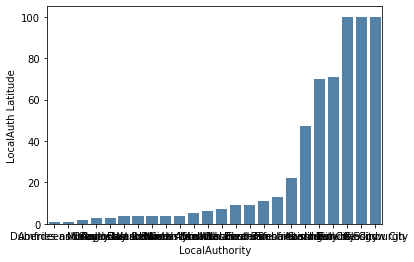

In [453]:
sns.barplot(data=s_venues_sort, x = s_venues_sort.index, y = 'LocalAuth Latitude', color = 'steelblue')
plt.show()

In [306]:
print('There are {} uniques categories.'.format(len(scotland_venues['Venue Category'].unique())))

There are 170 uniques categories.


In [393]:
# one hot encoding
scotland_onehot = pd.get_dummies(scotland_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
scotland_onehot['LocalAuthority'] = scotland_venues['LocalAuthority'] 

# move neighborhood column to the first column
fixed_columns = [scotland_onehot.columns[-1]] + list(scotland_onehot.columns[:-1])
scotland_onehot = scotland_onehot[fixed_columns]

scotland_onehot.head()

,LocalAuthority,Afghan Restaurant,Airport,American Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Garage,BBQ Joint,Bakery,Bank,Bar,Basketball Court,Beach,Bed & Breakfast,Beer Bar,Bike Shop,Bistro,Boat or Ferry,Bookstore,Botanical Garden,Brazilian Restaurant,Breakfast Spot,Brewery,Buffet,Burger Joint,Bus Station,Café,Campground,Canal Lock,Casino,Castle,Cheese Shop,Chinese Restaurant,Church,Clothing Store,Cocktail Bar,Coffee Shop,College Gym,Concert Hall,Convenience Store,Deli / Bodega,Department Store,Diner,Discount Store,Distillery,Doner Restaurant,Donut Shop,Electronics Store,English Restaurant,Event Space,Farm,Farmers Market,Fast Food Restaurant,Field,Fish & Chips Shop,Flight School,French Restaurant,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,German Restaurant,Gift Shop,Golf Course,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Hardware Store,Hill,Historic Site,History Museum,Home Service,Hostel,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indoor Play Area,Irish Pub,Italian Restaurant,Japanese Restaurant,Juice Bar,Kitchen Supply Store,Korean Restaurant,Latin American Restaurant,Light Rail Station,Lighting Store,Liquor Store,Malay Restaurant,Massage Studio,Mediterranean Restaurant,Mexican Restaurant,Modern European Restaurant,Monument / Landmark,Mountain,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Neighborhood,Nightclub,Noodle House,Outdoor Sculpture,Outdoor Supply Store,Outlet Mall,Outlet Store,Paintball Field,Palace,Park,Pedestrian Plaza,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Plaza,Pool,Pool Hall,Portuguese Restaurant,Post Office,Pub,Rest Area,Restaurant,Road,Rugby Pitch,Russian Restaurant,Sandwich Place,Scenic Lookout,Science Museum,Scottish Restaurant,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Soccer Field,Soccer Stadium,South Indian Restaurant,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Stationery Store,Steakhouse,Student Center,Supermarket,Sushi Restaurant,Tapas Restaurant,Tea Room,Thai Restaurant,Theater,Toy / Game Store,Track Stadium,Trail,Train Station,Turkish Restaurant,Vegetarian / Vegan Restaurant,Video Game Store,Warehouse Store,Water Park,Whisky Bar,Zoo
0,Aberdeen City,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Aberdeen City,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Aberdeen City,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Aberdeen City,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Aberdeen City,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [394]:
scotland_onehot.shape

(886, 171)

In [395]:
scotland_grouped = scotland_onehot.groupby('LocalAuthority').mean().reset_index()
scotland_grouped.head()

,LocalAuthority,Afghan Restaurant,Airport,American Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Garage,BBQ Joint,Bakery,Bank,Bar,Basketball Court,Beach,Bed & Breakfast,Beer Bar,Bike Shop,Bistro,Boat or Ferry,Bookstore,Botanical Garden,Brazilian Restaurant,Breakfast Spot,Brewery,Buffet,Burger Joint,Bus Station,Café,Campground,Canal Lock,Casino,Castle,Cheese Shop,Chinese Restaurant,Church,Clothing Store,Cocktail Bar,Coffee Shop,College Gym,Concert Hall,Convenience Store,Deli / Bodega,Department Store,Diner,Discount Store,Distillery,Doner Restaurant,Donut Shop,Electronics Store,English Restaurant,Event Space,Farm,Farmers Market,Fast Food Restaurant,Field,Fish & Chips Shop,Flight School,French Restaurant,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,German Restaurant,Gift Shop,Golf Course,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Hardware Store,Hill,Historic Site,History Museum,Home Service,Hostel,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indoor Play Area,Irish Pub,Italian Restaurant,Japanese Restaurant,Juice Bar,Kitchen Supply Store,Korean Restaurant,Latin American Restaurant,Light Rail Station,Lighting Store,Liquor Store,Malay Restaurant,Massage Studio,Mediterranean Restaurant,Mexican Restaurant,Modern European Restaurant,Monument / Landmark,Mountain,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Neighborhood,Nightclub,Noodle House,Outdoor Sculpture,Outdoor Supply Store,Outlet Mall,Outlet Store,Paintball Field,Palace,Park,Pedestrian Plaza,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Plaza,Pool,Pool Hall,Portuguese Restaurant,Post Office,Pub,Rest Area,Restaurant,Road,Rugby Pitch,Russian Restaurant,Sandwich Place,Scenic Lookout,Science Museum,Scottish Restaurant,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Soccer Field,Soccer Stadium,South Indian Restaurant,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Stationery Store,Steakhouse,Student Center,Supermarket,Sushi Restaurant,Tapas Restaurant,Tea Room,Thai Restaurant,Theater,Toy / Game Store,Track Stadium,Trail,Train Station,Turkish Restaurant,Vegetarian / Vegan Restaurant,Video Game Store,Warehouse Store,Water Park,Whisky Bar,Zoo
0,Aberdeen City,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.08,0.0,0.02,0.0,0.06,0.0,0.00,0.0,0.010000,0.00,0.00,0.0,0.0,0.0,0.0,0.000000,0.060000,0.0,0.0,0.01,0.000000,0.0,0.0,0.00,0.000000,0.00,0.040000,0.0,0.00,0.0,0.0,0.02,0.0,0.000000,0.0,0.0,0.0,0.01,0.01,0.0,0.0,0.00,0.000000,0.0,0.0,0.0,0.00,0.010000,0.0,0.0,0.01,0.00,0.00,0.0,0.0,0.0,0.100000,0.01,0.02,0.0,0.0,0.00,0.00,0.0,0.00,0.01,0.080000,0.02,0.00,0.01,0.01,0.0,0.01,0.02,0.01,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.0,0.01,0.01,0.00,0.00,0.0,0.0,0.01,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.000000,0.0,0.0,0.00,0.040000,0.0,0.01,0.0,0.0,0.01,0.00,0.0,0.0,0.0,0.0,0.03,0.0,0.050000,0.00,0.0,0.0,0.030000,0.01,0.00,0.00,0.00,0.03,0.0,0.01,0.0,0.0,0.01,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.01,0.0,0.040000,0.01,0.0,0.01,0.0,0.01,0.0,0.0,0.000000,0.0,0.01,0.00,0.0,0.0,0.0,0.01,0.0
1,Aberdeenshire,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.000000,0.00,0.00,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.00,0.250000,0.0,0.0,0.00,0.000000,0.00,0.000000,0.0,0.00,0.0,0.0,0.00,0.0,0.000000,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.000000,0.0,0.0,0.0,0.00,0.000000,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.000000,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0.25,0.00,0.000000,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.25,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.000000,0.0,0.0,0.00,0.000000,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.250000,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.000000,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.000000,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0
2,Angus,0.0,

In [396]:
scotland_grouped.shape

(29, 171)

In [390]:
num_top_venues = 5
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [397]:
# declare number of venues
num_top_venues = 5

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['LocalAuthority']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['LocalAuthority'] = scotland_grouped['LocalAuthority']

for ind in np.arange(scotland_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(scotland_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,LocalAuthority,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Aberdeen City,Grocery Store,Bar,Hotel,Café,Beer Bar
1,Aberdeenshire,Castle,Restaurant,Home Service,Massage Studio,Zoo
2,Angus,Supermarket,Fast Food Restaurant,Restaurant,Discount Store,Sandwich Place
3,City of Edinburgh,Hotel,Café,Bar,Cocktail Bar,Park
4,Clackmannanshire,Grocery Store,Café,Park,Furniture / Home Store,Outlet Mall


In [398]:
first = neighborhoods_venues_sorted['1st Most Common Venue'].value_counts().to_frame()
second = neighborhoods_venues_sorted['2nd Most Common Venue'].value_counts().to_frame()
third = neighborhoods_venues_sorted['3rd Most Common Venue'].value_counts().to_frame()

onetothree = pd.merge(first, second, how = 'outer', left_index=True, right_index=True)
onetothree = pd.merge(onetothree, third, how = 'outer', left_index=True, right_index=True)
onetothree.fillna(0, inplace=True)
onethreesorted = onetothree.sort_values('1st Most Common Venue', ascending=False)

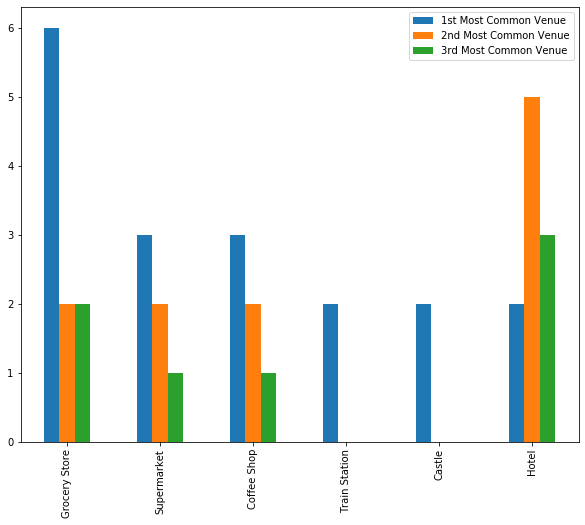

In [399]:
onethreesorted.head(6).plot(kind = 'bar', 
                           figsize = (10,8))

In [415]:
# set number of clusters
kclusters = 2

scotland_grouped_clustering = scotland_grouped.drop('LocalAuthority', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(scotland_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [401]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

scotland_merged = scotland_df_all

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
scotland_merged = scotland_merged.join(neighborhoods_venues_sorted.set_index('LocalAuthority'), on='LocalAuthority')



# check the last columns!
scotland_merged.head()

,Local authority code,LocalAuthority,AveragePrice,SalesVolume,TotalValue,latitude,longitude,UrbanAreas,RuralAreas,TotalArea,Population,PopDensity,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,S12000033,Aberdeen City,185268.611241,427.0,79109697.0,57.1482,-2.09281,8478.177586,10092.451054,18570.628640,228670,12.313530,1.0,Grocery Store,Bar,Hotel,Café,Beer Bar
1,S12000034,Aberdeenshire,216034.723282,524.0,113202195.0,57.1667,-2.66667,5770.833679,625490.050889,631260.884568,261210,0.413791,1.0,Castle,Restaurant,Home Service,Massage Studio,Zoo
2,S12000041,Angus,181711.374501,251.0,45609555.0,56.6667,-2.91667,3000.761652,215177.785564,218178.547216,116200,0.532591,1.0,Supermarket,Fast Food Restaurant,Restaurant,Discount Store,Sandwich Place
3,S12000035,Argyll and Bute,180471.890688,247.0,44576557.0,56.4603,-5.86184,2312.039540,688634.581138,690946.620678,85870,0.124279,NaN,NaN,NaN,NaN,NaN,NaN
4,S12000036,City of Edinburgh,296394.368824,1174.0,347966989.0,55.9533,-3.18837,13343.762443,12989.628748,26333.391191,524930,19.934007,1.0,Hotel,Café,Bar,Cocktail Bar,Park


In [402]:
scotland_merged.dropna(inplace=True)

In [403]:

# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=6)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, LocalAuth, cluster in zip(scotland_merged['latitude'], scotland_merged['longitude'], scotland_merged['LocalAuthority'], scotland_merged['Cluster Labels']):
    label = folium.Popup(str(LocalAuth) + ', Scotland '+' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [334]:
scotland_merged.loc[scotland_merged['Cluster Labels'] == 0, scotland_merged.columns[[1] + list(range(5, scotland_merged.shape[1]))]]

,LocalAuthority,latitude,longitude,UrbanAreas,RuralAreas,TotalArea,Population,PopDensity,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Aberdeen City,57.1482,-2.09281,8478.177586,10092.451054,18570.628640,228670,12.313530,0.0,Grocery Store,Bar,Hotel,Café,Beer Bar,Restaurant,Supermarket,Park,Coffee Shop,Sandwich Place
1,Aberdeenshire,57.1667,-2.66667,5770.833679,625490.050889,631260.884568,261210,0.413791,0.0,Castle,Restaurant,Home Service,Massage Studio,Zoo,Furniture / Home Store,French Restaurant,Flight School,Fish & Chips Shop,Field
2,Angus,56.6667,-2.91667,3000.761652,215177.785564,218178.547216,116200,0.532591,0.0,Supermarket,Fast Food Restaurant,Restaurant,Discount Store,Sandwich Place,Grocery Store,Zoo,Farm,French Restaurant,Flight School
4,City of Edinburgh,55.9533,-3.18837,13343.762443,12989.628748,26333.391191,524930,19.934007,0.0,Hotel,Café,Bar,Cocktail Bar,Park,Coffee Shop,Beer Bar,Pub,Bakery,Indian Restaurant
5,Clackmannanshire,56.1664,-3.7514,5475.491721,10388.268386,15863.760107,51540,3.248914,0.0,Grocery Store,Café,Park,Furniture / Home Store,Outlet Mall,Clothing Store,Coffee Shop,Trail,Restaurant,Bus Station
7,Dundee City,56.4738,-2.96642,4940.165531,1037.517571,5977.683102,149320,24.979578,0.0,Hotel,Coffee Shop,Park,Café,Pub,Supermarket,Bar,Grocery Store,Italian Restaurant,Pizza Place
8,East Ayrshire,55.5,-4.25,3646.124929,122566.120992,126212.245921,122010,0.966705,0.0,Castle,Pool Hall,Restaurant,Train Station,Trail,Supermarket,English Restaurant,Flight School,Fish & Chips Shop,Field
9,East Dunbartonshire,55.9333,-4.2,3194.005602,14254.879345,17448.884947,108640,6.226186,0.0,Grocery Store,Coffee Shop,Fast Food Restaurant,Supermarket,Discount Store,Pharmacy,Pizza Place,Electronics Store,Sandwich Place,Clothing Store
10,East Lothian,55.9167,-2.75,2122.779217,65795.243689,67918.022906,107090,1.576754,0.0,Gastropub,Indian Restaurant,Café,History Museum,Grocery Store,Supermarket,Bakery,Farmers Market,French Restaurant,Flight School
11,East Renfrewshire,55.7495,-4.36066,3129.552386,14249.633733,17379.186119,95530,5.496805,0.0,Grocery Store,Supermarket,Golf Course,Steakhouse,Coffee Shop,Pharmacy,Discount Store,Scenic Lookout,Science Museum,Shopping Mall


In [335]:
scotland_merged.loc[scotland_merged['Cluster Labels'] == 1, scotland_merged.columns[[1] + list(range(5, scotland_merged.shape[1]))]]

,LocalAuthority,latitude,longitude,UrbanAreas,RuralAreas,TotalArea,Population,PopDensity,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
6,Dumfries and Galloway,55.0833,-3.83333,3766.42428,638853.109877,642619.534157,148860,0.231646,1.0,Art Museum,Campground,Zoo,Fast Food Restaurant,Garden Center,Garden,Furniture / Home Store,French Restaurant,Flight School,Fish & Chips Shop


In [336]:
scotland_merged.loc[scotland_merged['Cluster Labels'] == 2, scotland_merged.columns[[1] + list(range(5, scotland_merged.shape[1]))]]

,LocalAuthority,latitude,longitude,UrbanAreas,RuralAreas,TotalArea,Population,PopDensity,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
23,Perth and Kinross,56.5,-3.75,3792.924567,524764.58012,528557.504687,151950,0.287481,2.0,Brewery,Zoo,Farmers Market,Garden,Furniture / Home Store,French Restaurant,Flight School,Fish & Chips Shop,Field,Fast Food Restaurant


In [337]:
scotland_merged.loc[scotland_merged['Cluster Labels'] == 3, scotland_merged.columns[[1] + list(range(5, scotland_merged.shape[1]))]]

,LocalAuthority,latitude,longitude,UrbanAreas,RuralAreas,TotalArea,Population,PopDensity,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
16,Inverclyde,55.9,-4.75,2396.752612,13646.769026,16043.521638,77800,4.849309,3.0,Train Station,Soccer Stadium,Zoo,Farm,Furniture / Home Store,French Restaurant,Flight School,Fish & Chips Shop,Field,Fast Food Restaurant


In [338]:
scotland_merged.loc[scotland_merged['Cluster Labels'] == 4, scotland_merged.columns[[1] + list(range(5, scotland_merged.shape[1]))]]

,LocalAuthority,latitude,longitude,UrbanAreas,RuralAreas,TotalArea,Population,PopDensity,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
22,Orkney Islands,59.0133,-3.23124,418.646209,98561.769306,98980.415515,22270,0.224994,4.0,Historic Site,Hotel,Zoo,Farm,Garden,Furniture / Home Store,French Restaurant,Flight School,Fish & Chips Shop,Field


In [339]:
scotland_df_all

,Local authority code,LocalAuthority,AveragePrice,SalesVolume,TotalValue,latitude,longitude,UrbanAreas,RuralAreas,TotalArea,Population,PopDensity
0,S12000033,Aberdeen City,185268.611241,427.0,7.910970e+07,57.1482,-2.09281,8478.177586,1.009245e+04,1.857063e+04,228670,12.313530
1,S12000034,Aberdeenshire,216034.723282,524.0,1.132022e+08,57.1667,-2.66667,5770.833679,6.254901e+05,6.312609e+05,261210,0.413791
2,S12000041,Angus,181711.374501,251.0,4.560956e+07,56.6667,-2.91667,3000.761652,2.151778e+05,2.181785e+05,116200,0.532591
3,S12000035,Argyll and Bute,180471.890688,247.0,4.457656e+07,56.4603,-5.86184,2312.039540,6.886346e+05,6.909466e+05,85870,0.124279
4,S12000036,City of Edinburgh,296394.368824,1174.0,3.479670e+08,55.9533,-3.18837,13343.762443,1.298963e+04,2.633339e+04,524930,19.934007
5,S12000005,Clackmannanshire,192275.352900,100.0,1.922754e+07,56.1664,-3.7514,5475.491721,1.038827e+04,1.586376e+04,51540,3.248914
6,S12000006,Dumfries and Galloway,162492.149152,295.0,4.793518e+07,55.0833,-3.83333,3766.424280,6.388531e+05,6.426195e+05,148860,0.231646
7,S12000042,Dundee City,155088.108695,322.0,4.993837e+07,56.4738,-2.96642,4940.165531,1.037518e+03,5.977683e+03,149320,24.979578
8,S12000008,East Ayrshire,134281.111607,224.0,3.007897e+07,55.5,-4.25,3646.124929,1.225661e+05,1.262122e+05,122010,0.966705
9,S12000045,East Dunbartonshire,240413.209821,224.0,5.385256e+07,55.9333,-4.2,3194.005602,1.425488e+04,1.744888e+04,108640,6.226186


In [352]:
venue_counts = scotland_venues.groupby(by='LocalAuthority').count().iloc[:,0:1]

In [355]:
venue_counts.columns = ['VenueCounts']

In [358]:
scotland_df_merged = scotland_df_all

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
scotland_df_merged = scotland_df_merged.join(venue_counts, on='LocalAuthority')
scotland_df_merged.dropna(inplace=True)


# check the last columns!
scotland_df_merged

,Local authority code,LocalAuthority,AveragePrice,SalesVolume,TotalValue,latitude,longitude,UrbanAreas,RuralAreas,TotalArea,Population,PopDensity,VenueCounts
0,S12000033,Aberdeen City,185268.611241,427.0,7.910970e+07,57.1482,-2.09281,8478.177586,10092.451054,18570.628640,228670,12.313530,100.0
1,S12000034,Aberdeenshire,216034.723282,524.0,1.132022e+08,57.1667,-2.66667,5770.833679,625490.050889,631260.884568,261210,0.413791,4.0
2,S12000041,Angus,181711.374501,251.0,4.560956e+07,56.6667,-2.91667,3000.761652,215177.785564,218178.547216,116200,0.532591,9.0
4,S12000036,City of Edinburgh,296394.368824,1174.0,3.479670e+08,55.9533,-3.18837,13343.762443,12989.628748,26333.391191,524930,19.934007,100.0
5,S12000005,Clackmannanshire,192275.352900,100.0,1.922754e+07,56.1664,-3.7514,5475.491721,10388.268386,15863.760107,51540,3.248914,18.0
6,S12000006,Dumfries and Galloway,162492.149152,295.0,4.793518e+07,55.0833,-3.83333,3766.424280,638853.109877,642619.534157,148860,0.231646,2.0
7,S12000042,Dundee City,155088.108695,322.0,4.993837e+07,56.4738,-2.96642,4940.165531,1037.517571,5977.683102,149320,24.979578,65.0
8,S12000008,East Ayrshire,134281.111607,224.0,3.007897e+07,55.5,-4.25,3646.124929,122566.120992,126212.245921,122010,0.966705,6.0
9,S12000045,East Dunbartonshire,240413.209821,224.0,5.385256e+07,55.9333,-4.2,3194.005602,14254.879345,17448.884947,108640,6.226186,42.0
10,S12000010,East Lothian,266748.522033,295.0,7.869081e+07,55.9167,-2.75,2122.779217,65795.243689,67918.022906,107090,1.576754,7.0


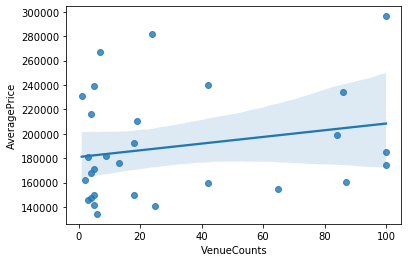

In [361]:
sns.regplot(data=scotland_df_merged, x="VenueCounts", y="AveragePrice")
plt.show()

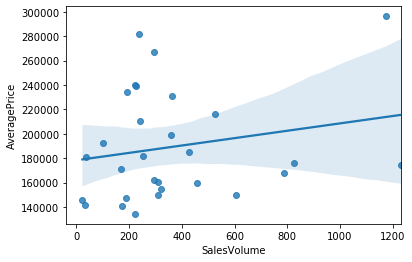

In [364]:
sns.regplot(data=scotland_df_merged, x="SalesVolume", y="AveragePrice")
plt.show()

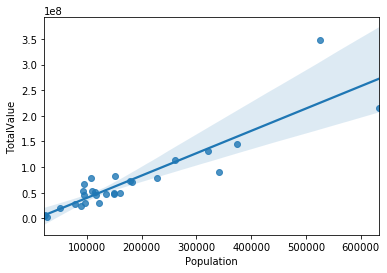

In [379]:
sns.regplot(data=scotland_df_merged, x="Population", y="TotalValue")
plt.show()

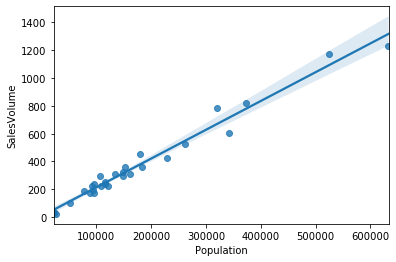

In [380]:
sns.regplot(data=scotland_df_merged, x="Population", y="SalesVolume")
plt.show()

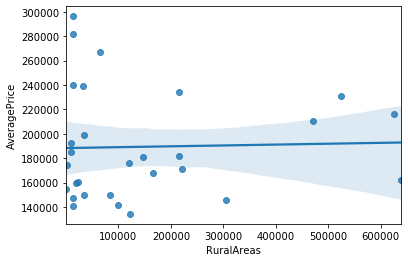

In [384]:
sns.regplot(data=scotland_df_merged, x="RuralAreas", y="AveragePrice")
plt.show()

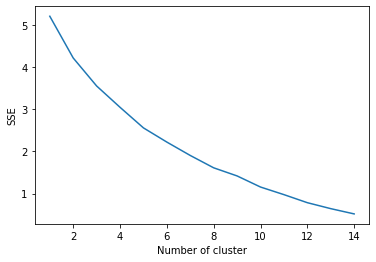

In [416]:
import pandas as pd
from sklearn.datasets import load_iris
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# iris = load_iris()
# X = pd.DataFrame(iris.data, columns=iris['feature_names'])
#print(X)
# data = X[['sepal length (cm)', 'sepal width (cm)', 'petal length (cm)']]

sse = {}

for k in range(1, 15):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(scotland_grouped_clustering)
    scotland_grouped_clustering["clusters"] = kmeans.labels_
    #print(data["clusters"])
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

In [456]:
# scotland_grouped_clustering?